# Exploratory Data Analysis of Chicago Taxi Dataset

the dataset was cleaned and explored in this section. We used Google Big query to query the data and libraries like Matplotlib , Seaborn and Folium for our visualisation. All the findings and analysis have been documented in this notebook. We have divided this note book into sub sections. They are:
1. Non Null value Analyis and Data Filteration
2. Univariate Analysis
3. Analysis of Trip Fare and Trip Demand
4. Analysis On Effect Of Weather Conditions On Taxi Demand
5. Analysis Of Crime Rate On Taxi Demand
6.  Bivariate Analysis


In [280]:
# Importing the required libraries
from google.cloud import bigquery
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')


In [481]:
# Create a "Client" object
client = bigquery.Client()

# Construct a reference to the "chicago_taxi_trips" dataset
dataset_ref = client.dataset("chcg_dtst", project="us-gcp-ame-con-01e-npd-1")

# API request - fetch the dataset
dataset = client.get_dataset(dataset_ref)

# Construct a reference to the "taxi_trips" table
table_ref = dataset_ref.table("tx_trps")

# API request - fetch the table
table = client.get_table(table_ref)

# Preview the first five lines of the table
client.list_rows(table, max_results=5).to_dataframe()

,unique_key,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,dropoff_community_area,...,extras,trip_total,payment_type,company,pickup_latitude,pickup_longitude,pickup_location,dropoff_latitude,dropoff_longitude,dropoff_location
0,7dc02b1766f3b11441c552c77a259a48e9f5d7c7,7f8c5c7d2db53a8c86c661199f322759984b3125ff0efa...,2019-08-26 08:15:00+00:00,2019-08-26 09:15:00+00:00,3844,18.10,NaN,NaN,NaN,NaN,...,10.0,61.00,Credit Card,Medallion Leasin,NaN,NaN,None,NaN,NaN,None
1,26de27d71db1ada67ea84129885b372e5a118b0a,2a7f2629f90d61d90f15bdca00c76f1aaee7eed62c7cb4...,2019-08-20 22:00:00+00:00,2019-08-20 22:30:00+00:00,1451,14.53,1.703198e+10,NaN,76.0,NaN,...,25.5,62.75,Credit Card,Chicago Carriage Cab Corp,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,None
2,8c11e75ea1b16d21b59e0a7705ce2b1952dd88a6,c95fefaa51d17df848928c43d08e8383fb003ee44d8d86...,2019-08-25 21:15:00+00:00,2019-08-25 21:30:00+00:00,660,1.70,1.703108e+10,1.703133e+10,8.0,33.0,...,1.5,13.50,Credit Card,Choice Taxi Association,41.892073,-87.628874,POINT (-87.6288741572 41.8920726347),41.859350,-87.617358,POINT (-87.6173580061 41.859349715)
3,652af4676dc7b7b49c6121baf86a16b1da0a1fa3,301714b1e2abeedaf1c293e00624ad6edf1d79e362da92...,2016-09-26 15:00:00+00:00,2016-09-26 15:15:00+00:00,420,0.60,NaN,NaN,NaN,NaN,...,0.0,5.75,Cash,Sun Taxi,NaN,NaN,None,NaN,NaN,None
4,d76f8b36289c6c0de0efca2830c6ec3afaae5014,b67c358162b4dbf47ca3cad892f6cf33d05d7dfe0b1397...,2017-07-22 19:45:00+00:00,2017-07-22 20:15:00+00:00,1080,3.40,NaN,NaN,8.0,3.0,...,1.0,14.00,Cash,Taxi Affiliation Services,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.965812,-87.655879,POINT (-87.6558787862 41.96581197)


##  Non Null value Analyis and Data Filteration

In this section , we would be cleaning the data set and removing the null values. We will also put filters to make our data more in sync with real world scenario.

In [482]:
# Fetching the column names of the data set
column_names = client.list_rows(table, max_results=5).to_dataframe().columns.tolist()

# Query for Count of all Values in the raw data set

non_null_value_count = """
                    SELECT count(*) as total_count {}
                    FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps`
                    """

value_count_string = ''

# Fetching the count of observation for each column
for column_name in column_names:
    
    value_count_string = value_count_string + ',count({}) as {}'.format(column_name, column_name)
    
non_null_value_count = non_null_value_count.format(value_count_string)

# Setting up the big query
safe_config = bigquery.QueryJobConfig()

non_value_count = client.query(non_null_value_count,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
non_null_value_count_job_result = non_value_count.to_dataframe()

# Fetching the result
non_null_value_count_job_result

,total_count,unique_key,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,...,extras,trip_total,payment_type,company,pickup_latitude,pickup_longitude,pickup_location,dropoff_latitude,dropoff_longitude,dropoff_location
0,194992060,194992060,194992060,194992060,194974610,193693884,194989754,127141290,126213120,171867110,...,194987261,194987261,194992060,161398653,171888747,171888747,171888747,168537022,168537022,168537022


In [483]:
# Selecting the color pallete for plot
pal = sns.color_palette("Reds_d", len(non_null_value_count_job_result.T))

In [484]:
#Count of Non Null Values When 'Company' is Not Null
non_null_value_count = """
                    SELECT count(*) as total_count {}
                    FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps`
                    WHERE COMPANY IS NOT NULL
                    """
value_count_string = ''

# Fetching the count of observation for each column
for column_name in column_names:
    
    value_count_string = value_count_string + ',count({}) as {}'.format(column_name, column_name)
    
non_null_value_count = non_null_value_count.format(value_count_string)

# Setting up the big query
safe_config = bigquery.QueryJobConfig()

non_null_value_count_job = client.query(non_null_value_count,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
non_null_value_count_job_result1 = non_null_value_count_job.to_dataframe()

# Fetching the results
non_null_value_count_job_result1

,total_count,unique_key,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,...,extras,trip_total,payment_type,company,pickup_latitude,pickup_longitude,pickup_location,dropoff_latitude,dropoff_longitude,dropoff_location
0,161398653,161398653,161398653,161398653,161381203,160105481,161396401,106330306,105799748,144569611,...,161394221,161394221,161398653,161398653,144590011,144590011,144590011,141943074,141943074,141943074


In [485]:
#Count of Non Null Values When 'Company' is Not Null and 'pickup_community_area' is Not Null

non_null_value_count = """
                    SELECT count(*) AS total_count {}
                    FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps`
                    WHERE COMPANY IS NOT NULL AND pickup_community_area IS NOT NULL
                    """
value_count_string = ''

# Fetching the count of observation for each column
for column_name in column_names:
    value_count_string = value_count_string + ',count({}) as {}'.format(column_name, column_name)
    
non_null_value_count = non_null_value_count.format(value_count_string)

# Setting up the big query
safe_config = bigquery.QueryJobConfig()

non_null_value_count_job = client.query(non_null_value_count,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
non_null_value_count_job_result2 = non_null_value_count_job.to_dataframe()

# Fetching the results
non_null_value_count_job_result2

,total_count,unique_key,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,...,extras,trip_total,payment_type,company,pickup_latitude,pickup_longitude,pickup_location,dropoff_latitude,dropoff_longitude,dropoff_location
0,144569611,144569611,144569611,144569611,144552872,144543463,144567541,106226537,104931647,144569611,...,144565548,144565548,144569611,144569611,144569611,144569611,144569611,140515771,140515771,140515771


In [486]:
#Count of Non Null Values When 'Company' is Not Null and 'pickup_community_area' is Not Null, and other reasonable filters
non_null_value_count = """
                    SELECT count(*) AS total_count {}
                    FROM (Select *, trip_miles/(trip_seconds/3600) AS trip_speed  FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps`
                    WHERE company IS NOT NULL AND pickup_community_area IS NOT NULL and (trip_seconds>=60 AND trip_miles>0 and trip_total>=1) AND 
                    (fare<=1000 and extras<=1000 AND tolls<=1000 AND tips<=1000 and trip_total<=1000) AND EXTRACT(Year FROM trip_start_timestamp)>=2016 
                    AND EXTRACT(Year FROM trip_start_timestamp)<2020 AND (trip_total/trip_miles >=2 AND trip_total/trip_miles<=10) )
                    WHERE trip_speed>=1 AND trip_speed<=70
               
                     
                    """
value_count_string = ''

# Fetching the count of observation for each column
for column_name in column_names:
    
    value_count_string = value_count_string + ',count({}) as {}'.format(column_name, column_name)
    
non_null_value_count = non_null_value_count.format(value_count_string)

# Setting up the big query job
safe_config = bigquery.QueryJobConfig()

non_null_value_count_job = client.query(non_null_value_count,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
non_null_value_count_job_result3 = non_null_value_count_job.to_dataframe()

# Fetching the result
non_null_value_count_job_result3

,total_count,unique_key,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,...,extras,trip_total,payment_type,company,pickup_latitude,pickup_longitude,pickup_location,dropoff_latitude,dropoff_longitude,dropoff_location
0,43055255,43055255,43055255,43055255,43055255,43055255,43055255,31841630,31464434,43055255,...,43055255,43055255,43055255,43055255,43055255,43055255,43055255,41755969,41755969,41755969


[]

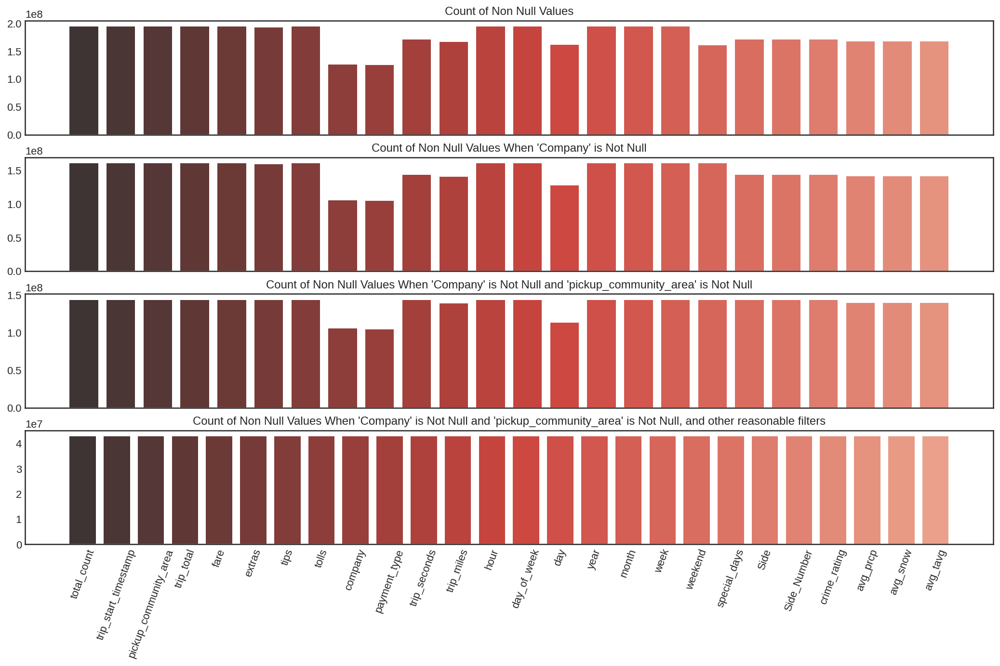

In [514]:
#Plotting all Non Null Count plots

# Plot of all Non Null values in the unprocessed data set
plt.rcParams["figure.figsize"] = [18, 10]

# Setting the position of plot
plt.subplot(4, 1, 1)

# Plotting the Barplot
g1 = sns.barplot(non_null_value_count_job_result.T.index, non_null_value_count_job_result.T[0].values, palette=np.array(pal[::-1]))

# Setting the x axis tick labels
g1.set(xticklabels=[])

# Setting the title of the plot
g1.set(title='Count of Non Null Values')

# Rotating the x axis table by 90 degress
plt.xticks(rotation=90)

# Plotting the graph
plt.plot()

# Plot of all Non Null values where Column Company doesnt have any  null values.
plt.subplot(4, 1, 2)

# Plotting the Barplot
g2 = sns.barplot(non_null_value_count_job_result1.T.index, non_null_value_count_job_result1.T[0].values, palette=np.array(pal[::-1]))

# Setting the x axis tick labels
g2.set(xticklabels=[])

# Setting the title of the plot
g2.set(title="Count of Non Null Values When 'Company' is Not Null")

# Plotting the graph
plt.plot()

# Plot of all Non Null values where Column Compny and pick up community dont have any null values.
plt.subplot(4, 1, 3)

# Plotting the Barplot
g3 = sns.barplot(non_null_value_count_job_result2.T.index, non_null_value_count_job_result2.T[0].values, palette=np.array(pal[::-1]))

# Setting the x axis tick labels
g3.set(xticklabels=[])

# Setting the title of the plot
g3.set(title="Count of Non Null Values When 'Company' is Not Null and 'pickup_community_area' is Not Null")

# Plotting the graph
plt.plot()

# Plot of all Non Null values where Column Compny and pick up community dont have any  null values. Also other filters like speed limit,non negative tripmiles etc.
plt.subplot(4, 1, 4)

# Plotting the Barplot
g4 = sns.barplot(non_null_value_count_job_result3.T.index, non_null_value_count_job_result3.T[0].values, palette=np.array(pal[::-1]))

# Setting the title of the plot
g4.set(title="Count of Non Null Values When 'Company' is Not Null and 'pickup_community_area' is Not Null, and other reasonable filters")

# Rotating the x axis table by 90 degress
plt.xticks(rotation=70)

# Plotting the graph
plt.plot()

In [488]:
# Construct a reference to the "taxi_trips" table for EDA after removing the null values
table_ref = dataset_ref.table("tx_trps_eda")

# API request - fetch the table
table = client.get_table(table_ref)

# Fetching the column names from the new cleaned data set
column_names = client.list_rows(table, max_results=5).to_dataframe().columns.tolist()

# Total Count of all the trips in the cleaned table
non_null_value_count = """
                    SELECT count(*) as total_count {}
                    FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                    """
value_count_string = ''

# Fetching the count of the observations of all the columns
for column_name in column_names:
    
    value_count_string = value_count_string + ',count({}) as {}'.format(column_name, column_name)
    
non_null_value_count = non_null_value_count.format(value_count_string)

# Setting up the big query job
safe_config = bigquery.QueryJobConfig()

non_null_value_count_job = client.query(non_null_value_count,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
non_null_value_count_job_result3 = non_null_value_count_job.to_dataframe()

# The final number of observation
non_null_value_count_job_result3

,total_count,trip_start_timestamp,pickup_community_area,trip_total,fare,extras,tips,tolls,company,payment_type,...,month,week,weekend,special_days,Side,Side_Number,crime_rating,avg_prcp,avg_snow,avg_tavg
0,43055255,43055255,43055255,43055255,43055255,43055255,43055255,43055255,43055255,43055255,...,43055255,43055255,43055255,43055255,43055255,43055255,43055255,43055255,43055255,43055255


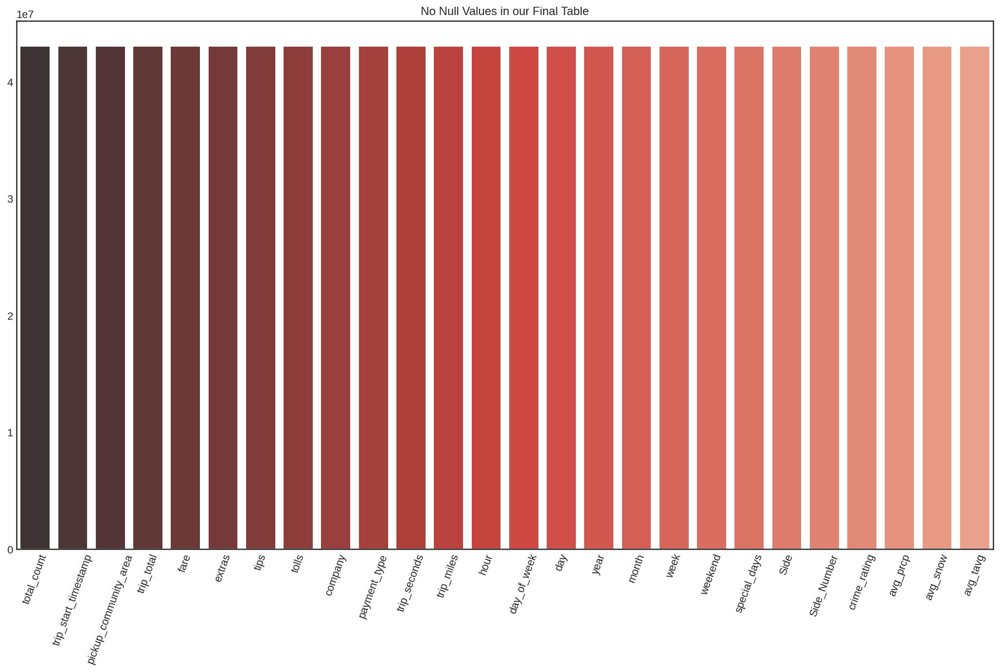

In [519]:
# Setting the figure size
plt.rcParams["figure.figsize"] = [18, 10]

# Choosing the color palette
pal = sns.color_palette("Reds_d", len(non_null_value_count_job_result3.T))

rank = non_null_value_count_job_result3.T.sort_values(by=[0])  

# Plotting the bar plot
fig = sns.barplot(non_null_value_count_job_result3.T.index, non_null_value_count_job_result3.T[0].values, palette=np.array(pal[::-1])).set(title="No Null Values in our Final Table")

# Rotating the x axis tick tables by 90 degrees
plt.xticks(rotation=70)

# Plotting the graph
plt.show()

In [502]:
# Construct a reference to the "taxi_trips" table
table_ref = dataset_ref.table("tx_trps_eda")

# API request - fetch the table
table = client.get_table(table_ref)

# Fetching the column names from the data set
column_names = client.list_rows(table, max_results=5).to_dataframe().columns.tolist()

# Counting the number of trips by year. The epoch format has been converted to timestamp format
non_null_value_count_year = """
                    SELECT EXTRACT(YEAR FROM trip_start_timestamp) AS year_, count(*) as total_count {}
                    FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                    GROUP BY year_
                    """
value_count_string = ''

# Fetching the number of observations in the data set
for column_name in column_names:
    value_count_string = value_count_string + ',count({}) as {}'.format(column_name, column_name)
    
non_null_value_count_year = non_null_value_count_year.format(value_count_string)

# Setting up big query job
safe_config = bigquery.QueryJobConfig()

non_null_value_count_year_job = client.query(non_null_value_count_year,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
non_null_value_count_year_job_result = non_null_value_count_year_job.to_dataframe()

#  total number of trips by year 
non_null_value_count_year_job_result

,year_,total_count,trip_start_timestamp,pickup_community_area,trip_total,fare,extras,tips,tolls,company,...,month,week,weekend,special_days,Side,Side_Number,crime_rating,avg_prcp,avg_snow,avg_tavg
0,2017,11963646,11963646,11963646,11963646,11963646,11963646,11963646,11963646,11963646,...,11963646,11963646,11963646,11963646,11963646,11963646,11963646,11963646,11963646,11963646
1,2018,10987130,10987130,10987130,10987130,10987130,10987130,10987130,10987130,10987130,...,10987130,10987130,10987130,10987130,10987130,10987130,10987130,10987130,10987130,10987130
2,2016,9726883,9726883,9726883,9726883,9726883,9726883,9726883,9726883,9726883,...,9726883,9726883,9726883,9726883,9726883,9726883,9726883,9726883,9726883,9726883
3,2019,10377596,10377596,10377596,10377596,10377596,10377596,10377596,10377596,10377596,...,10377596,10377596,10377596,10377596,10377596,10377596,10377596,10377596,10377596,10377596


In [506]:
# Number of trips by year in percentage
non_null_value_count_year_job_result['year_%'] = (non_null_value_count_year_job_result['total_count']/non_null_value_count_job_result3['total_count'][0])*100

non_null_value_count_year_job_result[['year_','year_%']].sort_values(by=['year_'])

,year_,year_%
2,2016,22.591628
0,2017,27.786727
1,2018,25.518674
3,2019,24.102972


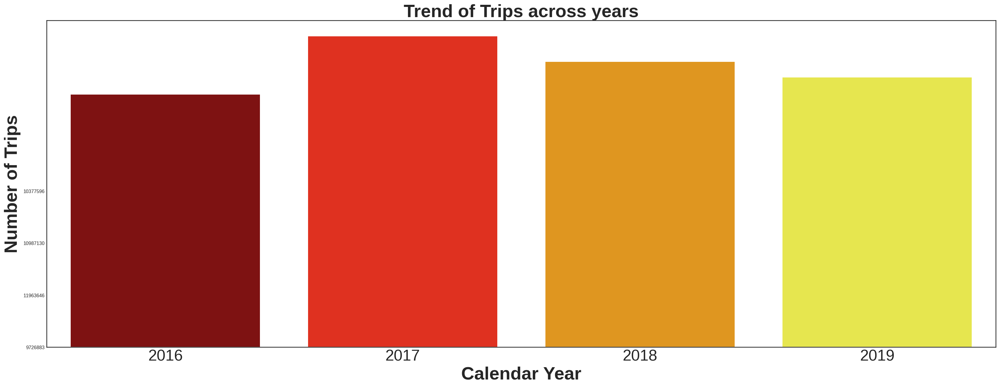

In [512]:
import matplotlib.style as style 
import matplotlib

# Query to fetch the number of trips per year
rides_per_year_query = """
                       SELECT EXTRACT(YEAR FROM trip_start_timestamp) AS year, 
                       COUNT(1) AS num_trips
                       FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                       GROUP BY year
                       ORDER BY year
                       """

# Set up the big query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

rides_per_year_ear_query_job = client.query(rides_per_year_query,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
rides_per_year_result = rides_per_year_ear_query_job.to_dataframe()

# Setting up the font family 
matplotlib.rcParams['font.family'] = "serif"

# Setting the style for the graph
style.use('seaborn-white')

# Plotting the graph
ax = sns.barplot(x='year', y='num_trips', data = rides_per_year_result, palette=("hot"))

# Setting the x axis ticklabels
ax.set_xticklabels(rides_per_year_result.year, rotation=0, fontsize = 26)

# Setting the y axis tick labels
ax.set_yticklabels(rides_per_year_result.num_trips, rotation=0, fontsize=8)

# Setting the title
plt.title('Trend of Trips across years', fontsize = 30, weight = 'bold')

# Setting the x axis label
plt.xlabel('Calendar Year', fontsize = 30, weight = 'bold')

# Setting the y axis label
plt.ylabel('Number of Trips', fontsize = 30, weight = 'bold')

# Saving the plot
plt.savefig('year_trend.png', transparent=True)

#Plotting the plot
plt.show()

## Univariate Analysis

In this section , we analyse the pattern and trend of a single variable at a point of time. We lookedat the following variables:
1. Trip seconds
2. Trip Miles
3. Trip Total
4. Cab Company

In [533]:
# Trip duration in seconds have been converted into hours
trip_duration = """
                SELECT trip_seconds/3600 as trip_duration, count(*)
                FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                GROUP BY trip_duration
"""

# Setting up the big query job
safe_config = bigquery.QueryJobConfig()

trip_duration_job = client.query(trip_duration,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
trip_duration_job_result = trip_duration_job.to_dataframe()

# Fetching the result
trip_duration_job_result

,trip_duration,f0_
0,0.343056,3862
1,0.150000,1860156
2,0.235833,8790
3,0.308889,4592
4,0.283333,577595
...,...,...
16855,2.521944,1
16856,21.771111,1
16857,15.099722,1
16858,2.930556,1


[Text(0, 0.0, '0.0'),
 Text(0, 0.025, '0.025'),
 Text(0, 0.05, '0.05'),
 Text(0, 0.07500000000000001, '0.075'),
 Text(0, 0.1, '0.1'),
 Text(0, 0.125, '0.125'),
 Text(0, 0.15000000000000002, '0.15'),
 Text(0, 0.17500000000000002, '0.175'),
 Text(0, 0.2, '0.2'),
 Text(0, 0.225, '0.225')]

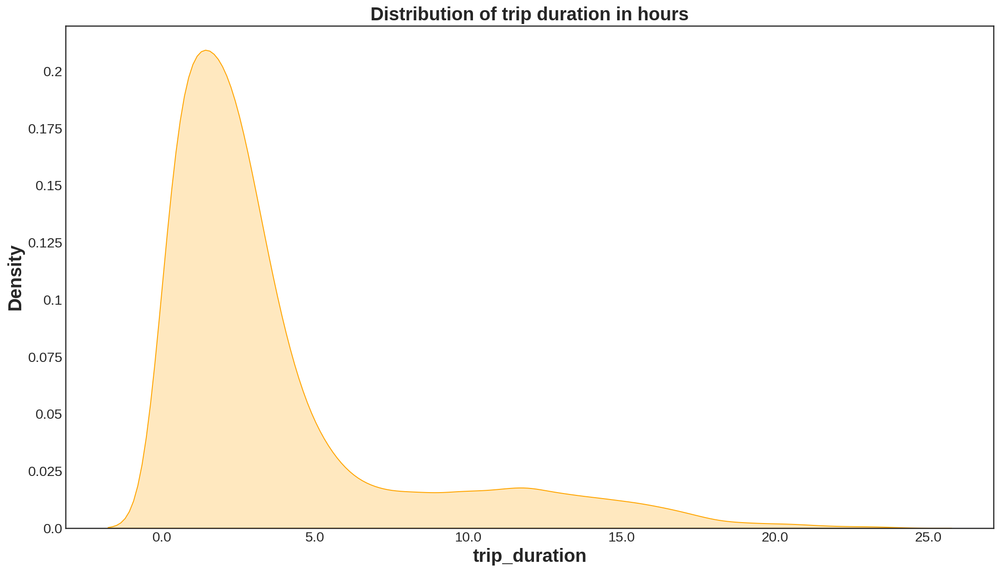

In [561]:
# Rounding off the  trip duration hours to two decimal places
trip_duration_job_result['trip_duration'] = np.round(trip_duration_job_result['trip_duration'],2)

# kernel density estimate (KDE) plot for visualizing the distribution of trip duration in hours
trip_duration_plot = sns.kdeplot(data=trip_duration_job_result, x='trip_duration', color="orange", fill=True)

#Setting title
trip_duration_plot.set_title("Distribution of trip duration in hours", fontsize=20, weight = 'bold')

# Setting the x axis label
trip_duration_plot.set_xlabel("trip_duration", fontsize=20, weight = 'bold')

# Setting the y axis label
trip_duration_plot.set_ylabel("Density", fontsize=20, weight = 'bold')

# # Setting the xtick font
xlabels = [round(x,0) for x in trip_duration_plot.get_xticks()]

trip_duration_plot.set_xticklabels(xlabels, fontsize=15)

# Setting the ytick font
ylabels = [round(x,3) for x in trip_duration_plot.get_yticks()]

trip_duration_plot.set_yticklabels(ylabels, fontsize=15)

In [563]:
# Trip Cost Plot
trip_total = """
                SELECT trip_total, count(*)
                FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                GROUP BY trip_total
                ORDER BY trip_total 
"""
# Setting up big query job
safe_config = bigquery.QueryJobConfig()

trip_total_job = client.query(trip_total,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
trip_total_job_result = trip_total_job.to_dataframe()

#Fetching the results
trip_total_job_result

,trip_total,f0_
0,1.00,38
1,1.02,1
2,1.07,1
3,1.10,2
4,1.11,3
...,...,...
13617,947.25,1
13618,963.25,1
13619,969.50,1
13620,980.75,1


[Text(0, 0.0, '0.0'),
 Text(0, 0.001, '0.001'),
 Text(0, 0.002, '0.002'),
 Text(0, 0.003, '0.003'),
 Text(0, 0.004, '0.004'),
 Text(0, 0.005, '0.005'),
 Text(0, 0.006, '0.006'),
 Text(0, 0.007, '0.007'),
 Text(0, 0.008, '0.008')]

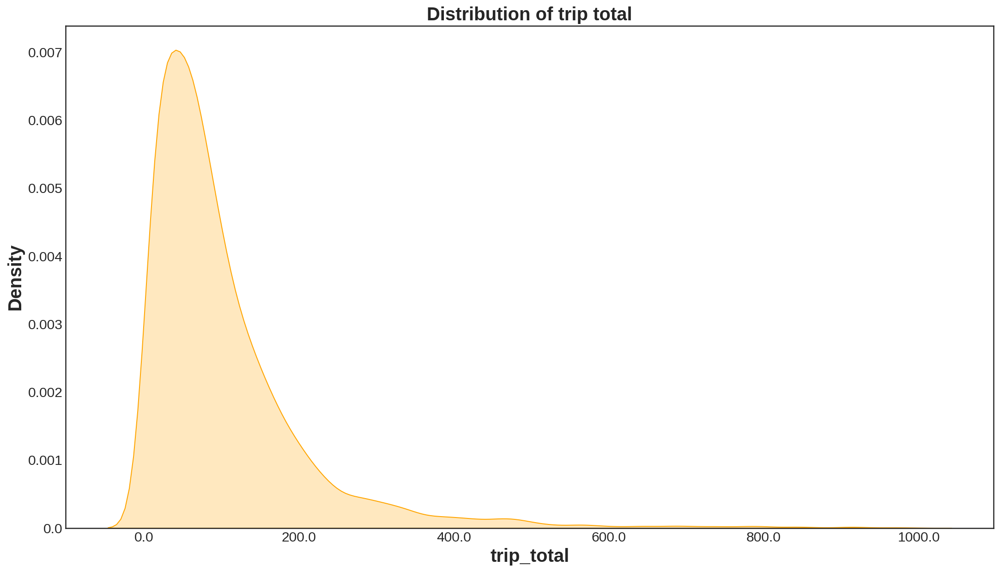

In [564]:
# Plotting the kernel density plot
trip_total_plot = sns.kdeplot(data=trip_total_job_result, x='trip_total', color="orange", fill=True)

#Setting title
trip_total_plot.set_title("Distribution of trip total", fontsize=20, weight = 'bold')

# Setting the x axis label
trip_total_plot.set_xlabel("trip_total", fontsize=20, weight = 'bold')

# Setting the y axis label
trip_total_plot.set_ylabel("Density", fontsize=20, weight = 'bold')

# # Setting the xtick font
xlabels = [round(x,0) for x in trip_total_plot.get_xticks()]

trip_total_plot.set_xticklabels(xlabels, fontsize=15)

# Setting the ytick font
ylabels = [round(x,3) for x in trip_total_plot.get_yticks()]

trip_total_plot.set_yticklabels(ylabels, fontsize=15)

In [565]:
# Grouping the trip_miles in ascending order
trip_miles = """
                SELECT trip_miles, count(*)
                FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                GROUP BY trip_miles
                ORDER BY trip_miles 
"""
# Setting up the big query job
safe_config = bigquery.QueryJobConfig()

trip_miles_job = client.query(trip_miles,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
trip_miles_job_result = trip_miles_job.to_dataframe()

# Fetching the result
trip_miles_job_result

,trip_miles,f0_
0,0.10,4
1,0.12,1
2,0.15,1
3,0.17,1
4,0.20,3
...,...,...
7815,399.70,1
7816,400.60,1
7817,405.97,1
7818,406.77,1


[Text(0, 0.0, '0.0'),
 Text(0, 0.002, '0.002'),
 Text(0, 0.004, '0.004'),
 Text(0, 0.006, '0.006'),
 Text(0, 0.008, '0.008'),
 Text(0, 0.01, '0.01'),
 Text(0, 0.012, '0.012'),
 Text(0, 0.014, '0.014')]

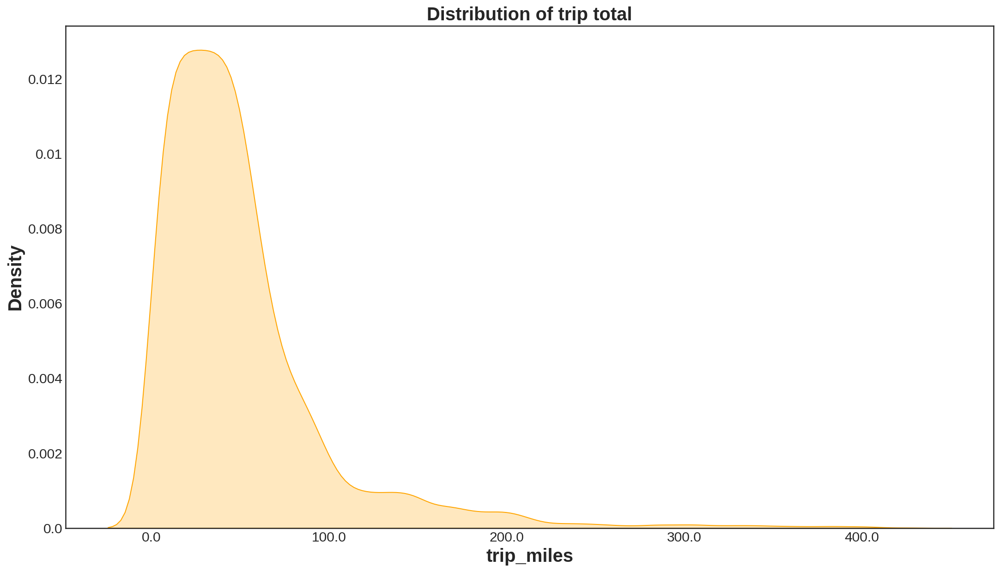

In [570]:
#Density plot to see the distribution of the trip miles in the final data set
trip_miles_density_plot = sns.kdeplot(data=trip_miles_job_result, x='trip_miles', color="orange", fill=True)

#Setting title
trip_miles_density_plot.set_title("Distribution of trip total", fontsize=20, weight = 'bold')

# Setting the x axis label
trip_miles_density_plot.set_xlabel("trip_miles", fontsize=20, weight = 'bold')

# Setting the y axis label
trip_miles_density_plot.set_ylabel("Density", fontsize=20, weight = 'bold')

# # Setting the xtick font
xlabels = [round(x,0) for x in trip_miles_density_plot.get_xticks()]

trip_miles_density_plot.set_xticklabels(xlabels, fontsize=15)

# Setting the ytick font
ylabels = [round(x,3) for x in trip_miles_density_plot.get_yticks()]

trip_miles_density_plot.set_yticklabels(ylabels, fontsize=15)

In [408]:
# Query to find the TOP 10 cab companies having the largest shares of taxi trips in descending order   

company_value = """SELECT company, count(*) as trip_count_by_company
                FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                GROUP BY company
                ORDER BY count(*) desc
                LIMIT 10
"""
# Setting up the big query job
safe_config = bigquery.QueryJobConfig()

company_value_job = client.query(company_value,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
company_value_job_result = company_value_job.to_dataframe()

# Fetching the Result
company_value_job_result

,company,trip_count_by_company
0,Chicago Carriage Cab Corp,5853206
1,Taxi Affiliation Services,5793541
2,City Service,3725180
3,Sun Taxi,3615789
4,Medallion Leasin,3385833
5,Taxi Affiliation Service Yellow,2749789
6,Choice Taxi Association,2289934
7,Dispatch Taxi Affiliation,1832455
8,Star North Management LLC,1816417
9,Globe Taxi,1782631


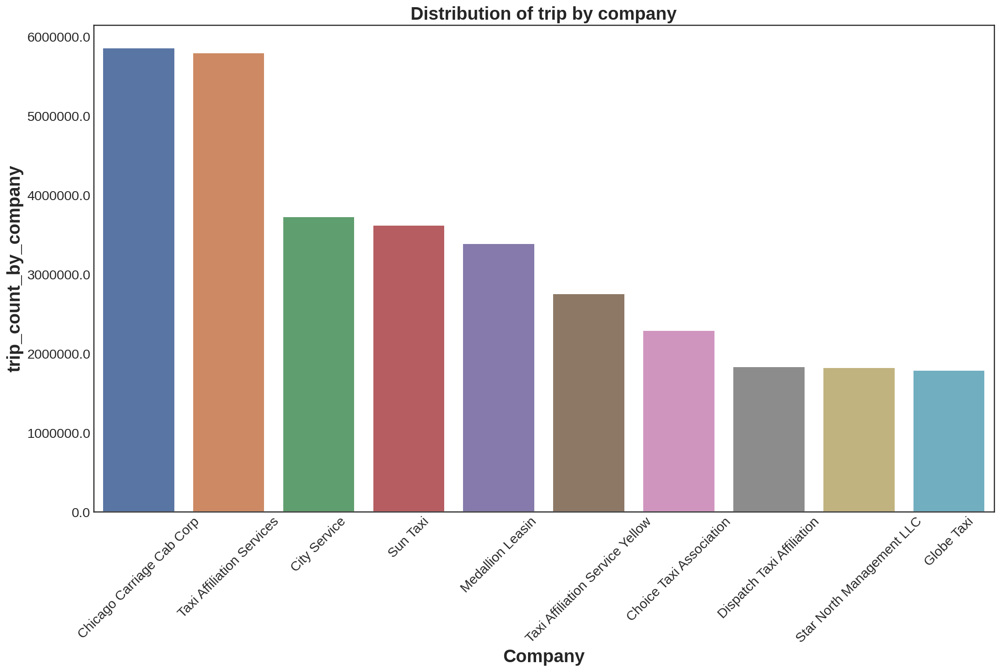

In [583]:
# Seaborn bar plot showring the Top 10 Cab Companies according to the taxi trips share.
barplot = sns.barplot(x='company',y='trip_count_by_company', data =company_value_job_result.sort_values(by=['trip_count_by_company'], ascending=False).iloc[:10,:])

#Setting title
barplot.set_title("Distribution of trip by company", fontsize=20, weight = 'bold')

# Setting the x axis tick label and font size
barplot.set_xticklabels(barplot.get_xmajorticklabels(), fontsize = 15)

# Setting the ytick font
barplot.set_yticklabels(barplot.get_yticks(), fontsize = 15)

# Setting the x axis  label and font size
barplot.set_xlabel("Company",fontsize=20, weight = 'bold')

# Setting the y axis label and font size
barplot.set_ylabel("trip_count_by_company",fontsize=20, weight = 'bold')

# barplot.set_xticklabels(fontsize=15)

# Rotating the x axis tick lable by 45 degrees
for item in barplot.get_xticklabels():
    
    item.set_rotation(45)

# Analysis of Trip Fare and Trip Demand 
Below section , we have ran sql queries and plotted different types of graphs like heat maps, grouped bar charts , line plots etc to check the pattern of the fare and the trip demand across different hours of the day and different days of the week. 

In [ ]:
# Fetching the total fare per month over the years
trip_value_year = """
                    SELECT EXTRACT(MONTH FROM trip_start_timestamp) AS month,EXTRACT(YEAR FROM trip_start_timestamp) AS year, sum(fare) as sum_total_fare
                    FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                    GROUP BY year, month
                    ORDER BY year, month
                    """
# Setting up the big query job
safe_config = bigquery.QueryJobConfig()

trip_value_year_job = client.query(trip_value_year,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
trip_value_year_job_result = trip_value_year_job.to_dataframe()

#Fethching the result
trip_value_year_job_result

In [585]:
# Query to calculate the average fare by hour and by day of the week
trip_value_day_hour = """
                    SELECT EXTRACT(Hour FROM trip_start_timestamp) AS hour,EXTRACT(DAYOFWEEK FROM trip_start_timestamp) AS dow, Avg(fare)
                    FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                    GROUP BY hour, dow
                    ORDER BY hour,dow
                    """

# Setting up the big query job
safe_config = bigquery.QueryJobConfig()

trip_value_day_hour_job = client.query(trip_value_day_hour,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
trip_value_day_hour_job_result = trip_value_day_hour_job.to_dataframe()

#Fetching the result
trip_value_day_hour_job_result

,hour,dow,f0_
0,0,1,12.037654
1,0,2,18.494537
2,0,3,18.141847
3,0,4,16.295211
4,0,5,16.356233
...,...,...,...
163,23,3,15.500282
164,23,4,15.550834
165,23,5,15.293295
166,23,6,13.128528


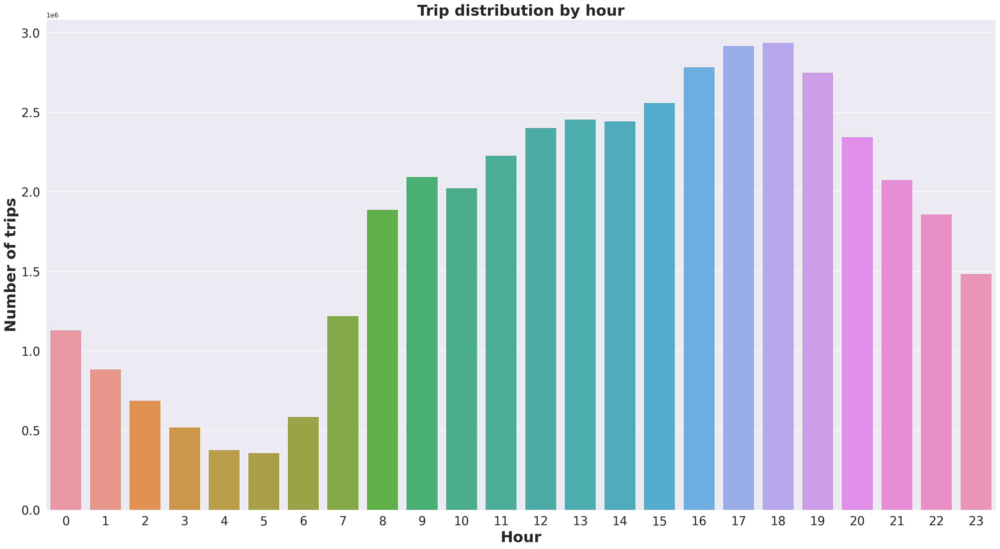

In [676]:
# Query to find the hourly taxi trip patterm
rides_per_month_query = """SELECT EXTRACT(HOUR FROM trip_start_timestamp) AS hour, 
                               COUNT(1) AS num_trips
                        FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                        GROUP BY hour
                        ORDER BY hour""" 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

rides_per_month_query_job =client.query(rides_per_month_query,job_config=safe_config)

# API request - run the query, and return a pandas DataFrame
rides_per_month_result = rides_per_month_query_job.to_dataframe()

# PLotting the barplot
sns.barplot(x='hour', y='num_trips', data = rides_per_month_result)

# Setting title for the plot
plt.title('Trip distribution by hour', fontsize = 25, weight = 'bold')

# Setting the x axis label
plt.xlabel('Hour', fontsize = 25, weight = 'bold')

# Setting the x axis tick label size
plt.xticks(fontsize = 20)

# Setting the y axis label
plt.ylabel('Number of trips', fontsize = 25, weight = 'bold')

# Setting the y axis tick label size
plt.yticks(fontsize = 20)

# Display the plot
plt.show()


In [631]:
# Creating a dictionary mapping for name and day name
import calendar

# Creating a list of day names
list_of_days = list(calendar.day_name)

list_of_days = [list_of_days.pop(-1)] + list_of_days

# Creating the final dictionay mapping
dict_of_days = dict(zip(range(1,8),list_of_days))
dict_of_days

{1: 'Sunday',
 2: 'Monday',
 3: 'Tuesday',
 4: 'Wednesday',
 5: 'Thursday',
 6: 'Friday',
 7: 'Saturday'}

In [637]:
import pandas as pd
cats = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# trip_value_day_hour_job_result['dow'] = trip_value_day_hour_job_result['dow'].apply(lambda x: dict_of_days[x])

trip_value_day_hour_job_result['dow'] = pd.Categorical(trip_value_day_hour_job_result['dow'], categories=cats, ordered=True)

trip_value_day_hour_job_result_p = trip_value_day_hour_job_result.pivot("dow","hour","f0_")


0         Sunday
1         Monday
2        Tuesday
3      Wednesday
4       Thursday
         ...    
163      Tuesday
164    Wednesday
165     Thursday
166       Friday
167     Saturday
Name: dow, Length: 168, dtype: category
Categories (7, object): ['Monday' < 'Tuesday' < 'Wednesday' < 'Thursday' < 'Friday' < 'Saturday' < 'Sunday']

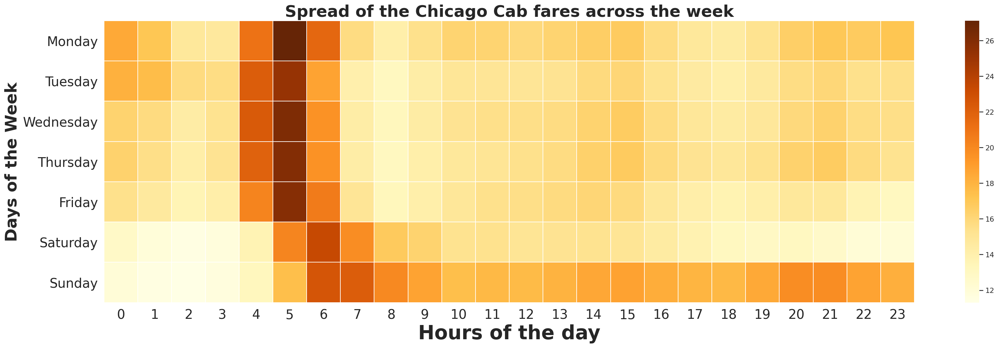

In [636]:
# Heat Map for the average fare by hour over days of a week
import matplotlib

import matplotlib.style as style

# Setting the font family
matplotlib.rcParams['font.family'] = "serif"

# Setting the style
style.use('seaborn-white')

# Setting the figure size
sns.set(rc={'figure.figsize':(28,8)})

# Plotting the heat map
sns.heatmap(trip_value_day_hour_job_result_p, linewidths=.5, cmap='YlOrBr')

# Setting the title
plt.title('Spread of the Chicago Cab fares across the week', fontsize = 25, weight = 'bold')

# Setting the label of the x axis
plt.xlabel('Hours of the day', fontsize = 30, weight = 'bold')

# Setting the size of the x axis tick label
plt.xticks(fontsize = 20)

# Setting the label of the y axis
plt.ylabel('Days of the Week', fontsize = 25, weight = 'bold')

# Setting the size of the y axis tick label
plt.yticks(fontsize = 20)

# Saving the graph
plt.savefig('heatmap_fares.png', transparent=True)

# Plotting thr graph
plt.show()

In [638]:
# Query to fetch the taxi trips by hour over the days of the week
trip_number_day_hour = """
                    SELECT EXTRACT(Hour FROM trip_start_timestamp) AS hour,EXTRACT(DAYOFWEEK FROM trip_start_timestamp) AS dow, count(*) AS total_trips
                    FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                    GROUP BY hour, dow
                    ORDER BY hour,dow
                    """

# Setting up the big query jb
safe_config = bigquery.QueryJobConfig()

trip_number_day_hour_job = client.query(trip_number_day_hour,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
trip_number_day_hour_job_result = trip_number_day_hour_job.to_dataframe()

# Fetching the result
trip_number_day_hour_job_result

,hour,dow,total_trips
0,0,1,303599
1,0,2,95254
2,0,3,90436
3,0,4,100336
4,0,5,118248
...,...,...,...
163,23,3,167030
164,23,4,188211
165,23,5,236432
166,23,6,305997


In [639]:
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

trip_number_day_hour_job_result['dow'] = trip_number_day_hour_job_result['dow'].apply(lambda x: dict_of_days[x])

trip_number_day_hour_job_result['dow'] = pd.Categorical(trip_number_day_hour_job_result['dow'], categories=cats, ordered=True)

trip_number_day_hour_job_result_p = trip_number_day_hour_job_result.pivot("dow","hour","total_trips")

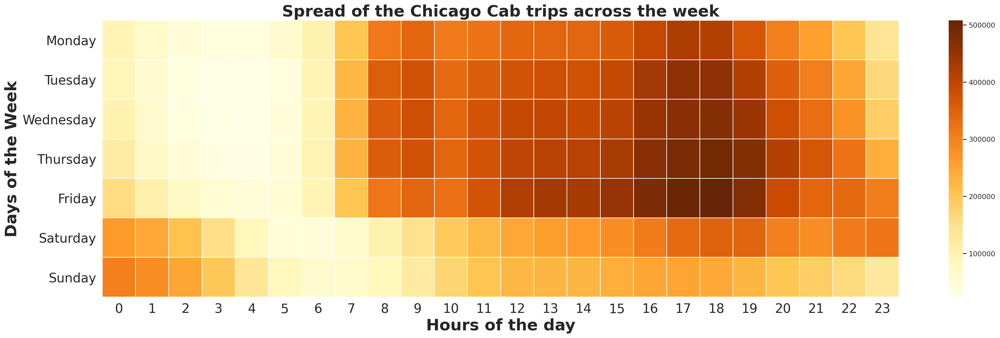

In [641]:
# Heat Map to show the taxi trips by hour over the days of the week

# Setting the font family
matplotlib.rcParams['font.family'] = "serif"

# Setting the figure style
style.use('seaborn-white')

# Setting the figure size
sns.set(rc={'figure.figsize':(28,8)})

# Making the heat map
ax = sns.heatmap(trip_number_day_hour_job_result_p, linewidths=.5, cmap='YlOrBr')

# Setting the title of the plot
plt.title('Spread of the Chicago Cab trips across the week', fontsize = 25, weight = 'bold')

# Setting the x axis label
plt.xlabel('Hours of the day', fontsize = 25, weight = 'bold')

# Setting the size of the x axis tick labels
plt.xticks(fontsize = 20)

# Setting the y axis label
plt.ylabel('Days of the Week', fontsize = 25, weight = 'bold')

# Setting the size of the y axis tick labels
plt.yticks(fontsize = 20)

# Saving the graph
plt.savefig('heatmap_trend.png', transparent=True)

# Plotting the heat map
plt.show()

In [665]:
# Query to find the total number of trips by community area
community_area_trips = """
                       SELECT pickup_community_area, 
                       COUNT(1) AS num_trips
                       FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                       GROUP BY pickup_community_area
                       ORDER BY num_trips desc
                       
                       """

# Setting up the big query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

community_area_trips_job = client.query(community_area_trips,job_config=safe_config )

# Converting the query result into dataframe
community_area_trips_result = community_area_trips_job.to_dataframe()

# Drop the null values
community_area_trips_result.dropna(inplace=True)

# Changing the type of the object
community_area_trips_result['pickup_community_area'] = community_area_trips_result['pickup_community_area'].astype('int64')

# Changing the type of the object
community_area_trips_result['pickup_community_area'] = community_area_trips_result['pickup_community_area'].astype('str')

# Uploading the crime data csv dataset
crime_data = pd.read_csv('crime_count.csv')

# Converting the crime count into log values
crime_data['crime_count'] = np.log(crime_data['crime_count'])

# Converting the Number of Trips into log values
community_area_trips_result['num_trips'] = np.log(community_area_trips_result['num_trips'])

# Fetching the result
community_area_trips_result

,pickup_community_area,num_trips
0,8,16.446396
1,32,16.261335
2,28,15.348343
3,76,15.257532
4,6,14.378761
...,...,...
72,9,7.254178
73,55,6.647688
74,54,6.641182
75,52,6.586172


In [666]:
# Taxi trips density by community number on the Chicago City Map. 
# Darker colour indicates higher number of taxi trips

import folium, json

#Define coordinates of where we want to center our map
chicago_coords = [41.881832, -87.623177]

# Plotting the map
m = folium.Map(location=chicago_coords, tiles="cartodbpositron", zoom_start=10.25)

# Creating bins for different quantiles for taxi trips 
bins = list(community_area_trips_result["num_trips"].quantile([0,0.25,0.75,0.95,1]))

with open('Boundaries - Community Areas (current).geojson') as jsonfile:
    data = json.load(jsonfile)

# Setting the params for the map plotting
folium.Choropleth(
    geo_data=data,
    data=community_area_trips_result,
    columns=["pickup_community_area", "num_trips"],
    fill_color="YlOrRd",
    key_on = 'feature.properties.area_num_1',
    fill_opacity=0.75,
    line_opacity=0.5,
    legend_name="Community Wise Trip Density",
    bins=bins,
    reset=True,
    popup="pickup_community_area"
).add_to(m)

# Adding the calculated layer to the folium map
folium.LayerControl().add_to(m)

# Save the figure
m.save('density_save.png')

# Plot the figure
m

In [669]:
# Query to calculate the average fare per comunnit basis
community_area_fare = """
                       SELECT pickup_community_area, 
                       avg(fare) as fare
                       FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                       GROUP BY pickup_community_area
                       
                       """
# Set up the query 
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

community_area_fare_job = client.query(community_area_fare,job_config=safe_config )

# API request - run the query, and return a pandas DataFrame
community_area_fare_job_result = community_area_fare_job.to_dataframe()

# Remove the null data
community_area_fare_job_result.dropna(inplace=True)

# Change the object data type
community_area_fare_job_result['pickup_community_area'] = community_area_fare_job_result['pickup_community_area'].astype('int64')

# Change the object data type
community_area_fare_job_result['pickup_community_area'] = community_area_fare_job_result['pickup_community_area'].astype('str')



In [670]:
import branca
import json
import requests


#Define coordinates of where we want to center our map
chicago_coords = [41.881832, -87.623177]

# Plotting the folium map
m = folium.Map(location=chicago_coords, tiles="cartodbpositron", zoom_start=10)

# Create bins for the average fare
bins = list(community_area_fare_job_result["fare"].quantile([0, 0.25,0.50,0.75,1]))

with open('Boundaries - Community Areas (current).geojson') as jsonfile:
    data = json.load(jsonfile)

# Setting the params for the map layer
folium.Choropleth(
    geo_data=data,
    data=community_area_fare_job_result,
    columns=["pickup_community_area", "fare"],
    fill_color="YlOrRd",
    key_on = 'feature.properties.area_num_1',
    fill_opacity=0.6,
    line_opacity=0.5,
    legend_name="Community Area vs Fare",
    bins=bins,
    reset=True,
).add_to(m)

# Adding the layer for the folium map
folium.LayerControl().add_to(m)

# Plotting the map
m

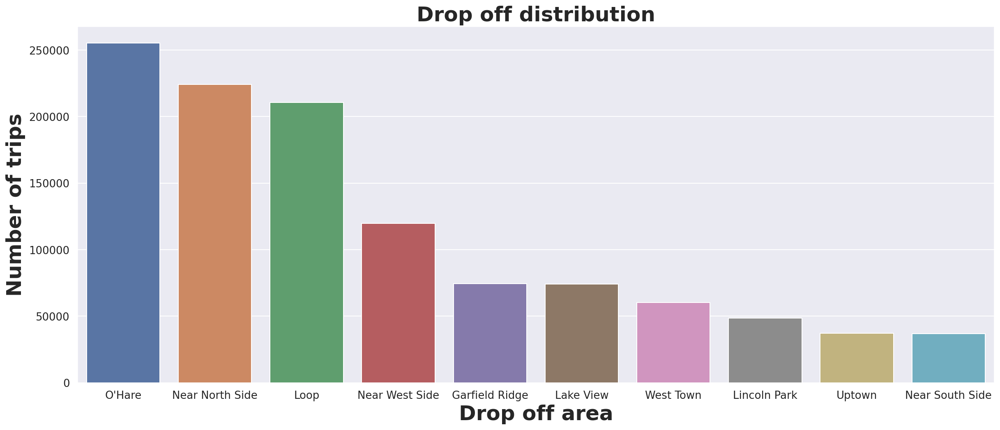

In [644]:
# Query to feth the top 10 places where the maximum taxi drops happen between the time range of 4 am and 6 am.

early_morning_rides_dropoff_query = """

                            With Table as (
                            SELECT * Except (Date,Community_Area_Number,pickup_community_area)
                            FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_cln2` as taxi_trip_dataset
                            JOIN `us-gcp-ame-con-01e-npd-1.chcg_dtst.comm_area`  as community_area_dataset ON taxi_trip_dataset.dropoff_community_area = community_area_dataset.Community_Area_Number
                            # Join `us-gcp-ame-con-01e-npd-1.chcg_dtst.chicago_crime` as crime_data_set on taxi_trip_dataset.dropoff_community_area = crime_data_set.community_area
                            Join `us-gcp-ame-con-01e-npd-1.chcg_dtst.weather_daily_averages` as weather_data_set on taxi_trip_dataset.Date = weather_data_set.Date
                            )

                            SELECT name as drop_off_area,count(*) as Num_of_trips
                            # FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_clnV2`
                            From Table
                            where hour>3 and hour< 7
                            Group by name
                            ORDER BY Num_of_trips Desc
                            LIMIT 10
                            
                            """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

early_morning_rides_dropoff_query_job =client.query(early_morning_rides_dropoff_query,job_config=safe_config)

# API request - run the query, and return a pandas DataFram
early_morning_rides_dropoff_result = early_morning_rides_dropoff_query_job.to_dataframe()

# Setting the figure size
sns.set(rc={'figure.figsize':(20,8)})

# Plotting a bar plot
barplot = sns.barplot(x='drop_off_area', y='Num_of_trips', data = early_morning_rides_dropoff_result)

# Setting title, xlabel and ylabel
plt.title('Drop off distribution', fontsize = 25, weight = 'bold')

# Setting x axis label 
plt.xlabel('Drop off area', fontsize = 25, weight = 'bold')

# Setting the size of the x axis tick labels
plt.xticks(fontsize = 13)

# Setting y axis label 
plt.ylabel('Number of trips', fontsize = 25, weight = 'bold')

# Setting the size of the y axis tick labels
plt.yticks(fontsize = 13)

# Saving the plot
plt.savefig('dropoff_location.png', transparent=True)

# View the plot
plt.show()

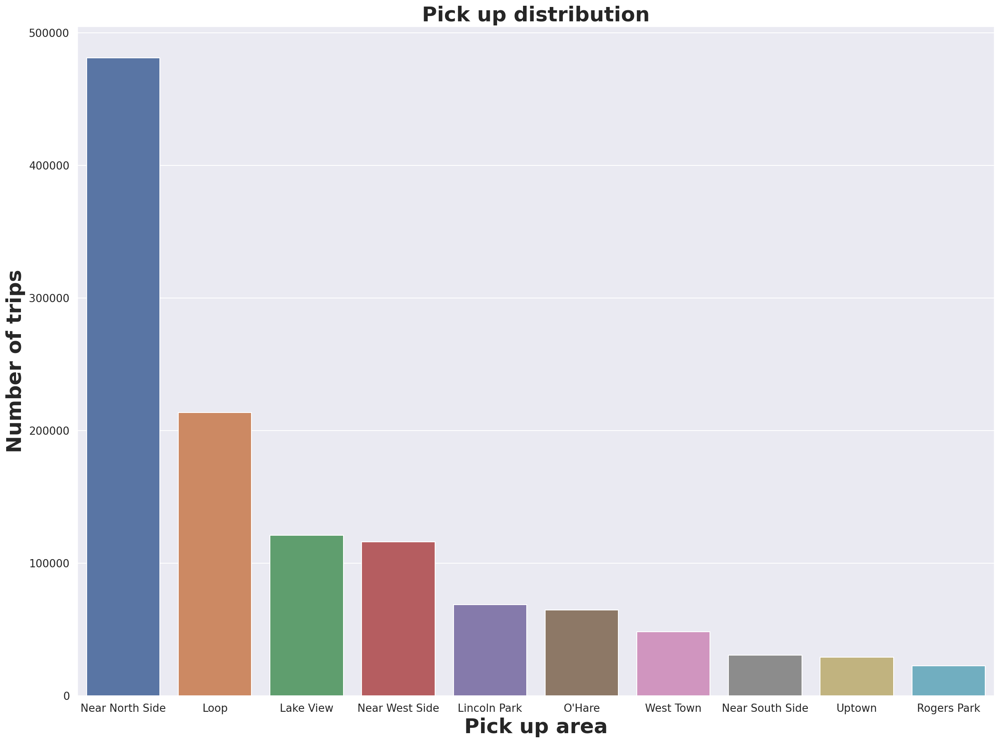

In [607]:
# Query to feth the top 10 places where the maximum taxi pick ups happen between the time range of 4 am and 6 am.
early_morning_rides_pickup_query = """

                            With Table as (
                            SELECT * Except (Date,Community_Area_Number,pickup_community_area)
                            FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_cln2` as taxi_trip_dataset
                            JOIN `us-gcp-ame-con-01e-npd-1.chcg_dtst.comm_area`  as community_area_dataset ON taxi_trip_dataset.pickup_community_area = community_area_dataset.Community_Area_Number
                            )

                            SELECT name as pick_up_area,count(*) as Num_of_trips
                            From Table
                            where hour>3 and hour< 7
                            Group by name
                            ORDER BY Num_of_trips Desc
                            LIMIT 10
                            """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

early_morning_rides_pickup_query_job =client.query(early_morning_rides_pickup_query,job_config=safe_config)

# API request - run the query, and return a pandas DataFram
early_morning_rides_pickup_result = early_morning_rides_pickup_query_job.to_dataframe()

# Setting the figure size
sns.set(rc={'figure.figsize':(20,15)})

# Plotting a bar plot
barplot = sns.barplot(x='pick_up_area', y='Num_of_trips', data = early_morning_rides_pickup_result)

# Setting title, xlabel and ylabel
plt.title('Pick up distribution', fontsize = 25, weight = 'bold')
plt.xlabel('Pick up area', fontsize = 25, weight = 'bold')
plt.xticks(fontsize = 13)
plt.ylabel('Number of trips', fontsize = 25, weight = 'bold')
plt.yticks(fontsize = 13)

# Saving the plot
plt.savefig('pickup_location.png', transparent=True)

# View the plot
plt.show()

# Analysis On Effect Of Weather Conditions On Taxi Demand

In this section we have seen how weather conditons can affect the demand for taxi trips. We have done the following analysis:

1. Average daily temperature effect on the taxi trips demand
2. Taxi trips across the months
3. Average temperature pattern over the months in chicago
4. Average snow and precipitation patterns in Chicago across the months in a calendar year


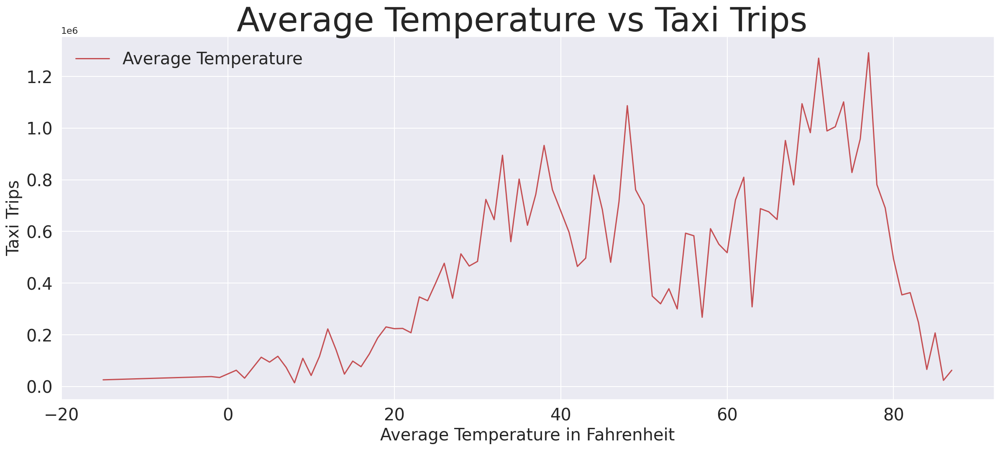

In [645]:
# Query to fetch the taxi demand over different range of temperature in Chicago

rides_per_temp_query = """
                            SELECT avg_tavg,count(trip_start_timestamp)  as trips
                            FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda` 
                            Group by avg_tavg 
                            Order by avg_tavg asc
                            """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

rides_per_temp_query_job =client.query(rides_per_temp_query,job_config=safe_config)

# API request - run the query, and return a pandas DataFrame
rides_per_temp_query = rides_per_temp_query_job.to_dataframe()

# Setting up the x axis
x1 = rides_per_temp_query.avg_tavg 

# Setting up the y axis
y1 = rides_per_temp_query.trips

# Plotting the Average Precipitation Line 
plt.plot(x1, y1,'r-', label = "Average Temperature" )

# Set the y axis label of the current axis.
plt.ylabel('Taxi Trips', fontsize = 20)

# Set the x axis label of the current axis.
plt.xlabel('Average Temperature in Fahrenheit', fontsize = 20)

# Set a title of the current axes.
plt.title('Average Temperature vs Taxi Trips ', fontsize =40)

# Show a legend on the plot
plt.legend( prop={'size': 20})

# Increase the tick Label size for x axis
plt.xticks(fontsize=20)#, rotation=45)

# Increase the tick Label size for y axis
plt.yticks(fontsize=20) 

# Saving the graph
plt.savefig('Average Temperature vs Taxi Trips.png')

# Plotting the graph
plt.show()

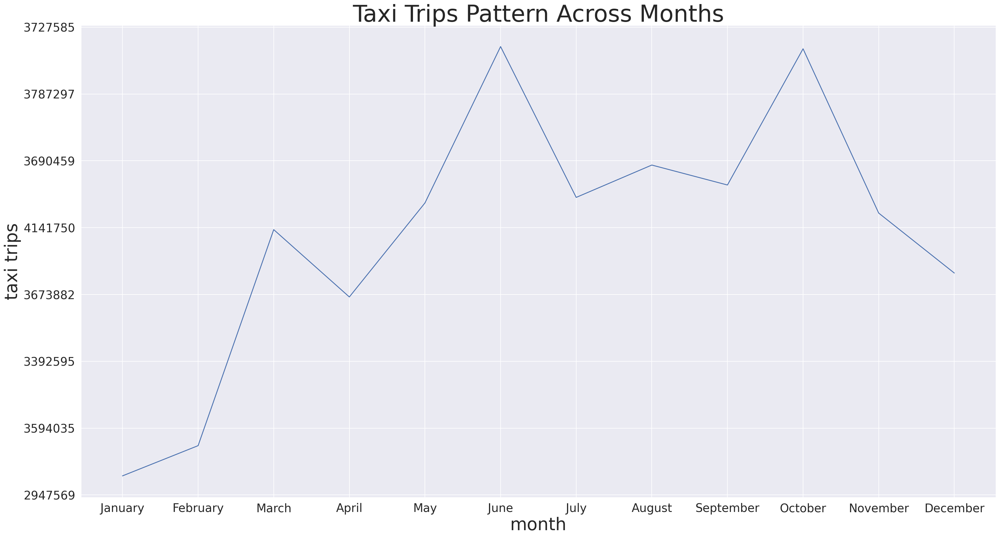

In [647]:
# Query to fecth the monthly pattern of taxitrips in chicago
rides_per_month_query = """
                            SELECT month, count(trip_start_timestamp)  as trips
                            FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda` 
                            Group by month
                            Order by month  asc
                            """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

rides_per_month_query_job =client.query(rides_per_month_query,job_config=safe_config)

# API request - run the query, and return a pandas DataFrame
rides_per_month_query = rides_per_month_query_job.to_dataframe()

# Creating a dictionary mapping for the month names and month number
dict_of_month= {1: 'January',2: 'February',3: 'March',4: 'April',5: 'May',6: 'June',7: 'July',8: 'August',
                9: 'September',10: 'October',11: 'November',12:'December'}

# Mapping the month number to the month name
rides_per_month_query['month'] = rides_per_month_query['month'].map(dict_of_month)

# Setting the fig size
sns.set(rc={'figure.figsize':(28.27,15)})

# Setting the color palette
pal = sns.color_palette("PuBuGn_d",12)

# Making the line plot
line_plot = sns.lineplot(x= rides_per_month_query.month ,y= rides_per_month_query.trips,data=rides_per_month_query,palette = pal)

# Setting the title of the figure
line_plot.set_title('Taxi Trips Pattern Across Months', fontsize = 40)

# Setting the x axis label name and size
line_plot.set_xlabel("month",fontsize=30)

# Setting the y axis label name and size
line_plot.set_ylabel("taxi trips",fontsize=30)

# Setting the x axis tick label name and size
line_plot.set_xticklabels(rides_per_month_query.month, rotation=0, fontsize = 20)

# Setting the y axis tick label name and size
line_plot.set_yticklabels(rides_per_month_query.trips, rotation=0, fontsize=20)

# Save the figure
plt.savefig('Taxi Trips Pattern Across Months.png')

# Plot the line plot
plt.show()


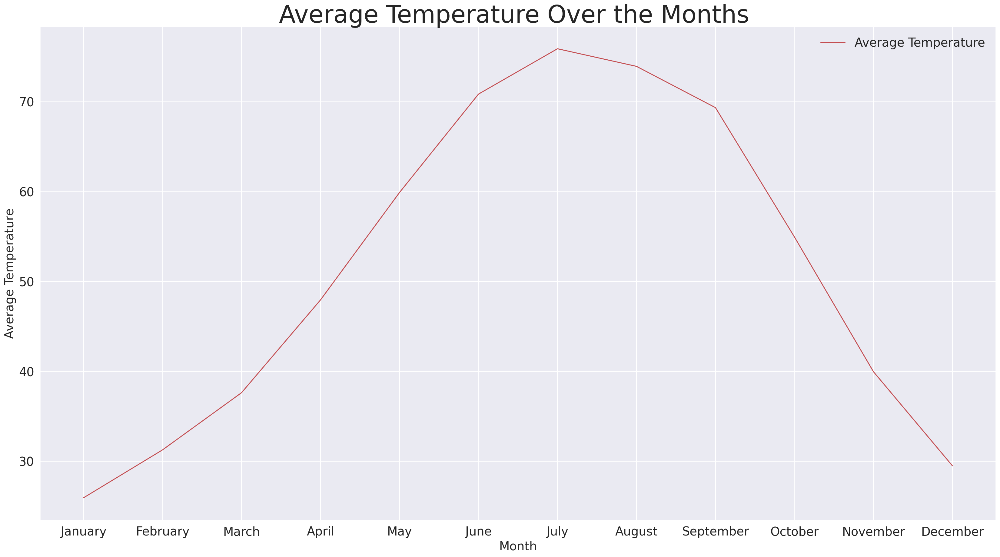

In [650]:
# Query to fetch the monthly average temperature pattern of Chicago City over a calendar year
Average_temp_per_month_query = """
                            SELECT AVG(avg_tavg) , month
                            FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda` 
                            Group BY month 
                            Order BY month asc
                            """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

Average_temp_per_month_query_job =client.query(Average_temp_per_month_query,job_config=safe_config)

# API request - run the query, and return a pandas DataFrame
Average_temp_per_month_query = Average_temp_per_month_query_job.to_dataframe()

# Mapping the month names with the month number 
Average_temp_per_month_query['month'] = Average_temp_per_month_query['month'].map(dict_of_month)

# Setting up the x axis
x1 = Average_temp_per_month_query.month 

# Setting up the y axis
y1 = Average_temp_per_month_query.f0_

# plotting the Average Precipitation Line 
plt.plot(x1, y1,'r-', label = "Average Temperature" )

# Set the y axis label of the current axis.
plt.ylabel('Average Temperature', fontsize = 20)

# Set the x axis label of the current axis.
plt.xlabel('Month', fontsize = 20)

# Set a title of the current axes.
plt.title('Average Temperature Over the Months ', fontsize =40)

# Show a legend on the plot
plt.legend( prop={'size': 20})

# Increase the tick Label size of x axis
plt.xticks(fontsize=20)#, rotation=20)

# Increase the tick Label size of y axis
plt.yticks(fontsize=20) 

# Sacving the plot
plt.savefig('Average Temperature Over the Months.png')

# Plotting the graph
plt.show()

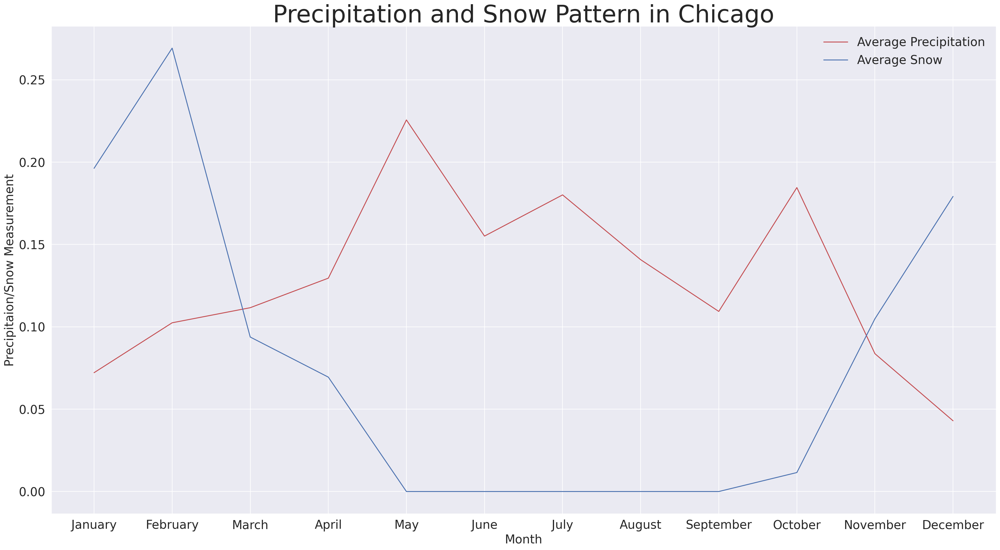

In [652]:
# Query to fetch the pattern of snow and precipitation in Chicago over the months in a calender year.
import matplotlib.pyplot as plt

rides_per_precip_query = """
                            SELECT AVG(avg_prcp), AVG(avg_snow), month  as month
                            FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda` 
                            Group by month
                            Order by month asc
                            """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

rides_per_precip_query_job =client.query(rides_per_precip_query,job_config=safe_config)

# API request - run the query, and return a pandas DataFrame
rides_per_precip_query = rides_per_precip_query_job.to_dataframe()

# Mapping the month names with the month number 
rides_per_precip_query['month'] = rides_per_precip_query['month'].map(dict_of_month)


# Setting the X axis for average precipitation
x1 = rides_per_precip_query.month

# Setting the Y axis for average precipitation
y1 = rides_per_precip_query.f0_

# plotting the Average Precipitation Line 
plt.plot(x1, y1, '-r', label = "Average Precipitation")

# Setting the X axis for average snowfall data
x2 = rides_per_precip_query.month

# Setting the Y axis for average snowfall data
y2 = rides_per_precip_query.f1_

# Plotting the average snowfall points 
plt.plot(x2, y2, label = "Average Snow")

# Set the x axis label of the current axis.
plt.xlabel('Month', fontsize = 20)

# Set the y axis label of the current axis.
plt.ylabel('Precipitaion/Snow Measurement', fontsize = 20)

# Set a title of the current axes.
plt.title('Precipitation and Snow Pattern in Chicago', fontsize =40 )

# Show a legend on the plot
plt.legend( prop={'size': 20})

# Increase the tick Label size of x axis
plt.xticks(fontsize=20, rotation=0)

# Increase the tick Label size of y axis
plt.yticks(fontsize=20) 

# Save the figure
plt.savefig('Precipitation and Snow Pattern in Chicago.png')

# Display a figure.
plt.show()




# Analysis Of Crime Rate On Taxi Demand

In this section we see if the crime rate of a community area affects the demand of a taxi trip.We are use the crime rate or the count as an indicator affluency. For instanace, we expect that a locality which has higher crime rate tend to be poorer , hence we expect a lower demand of private taxis. We have the done the analysis on the following:
1. Distribution of crime count in the chicago city map
2. How the  Top 10 areas with the highest crime rate fare on the taxi trips taken.

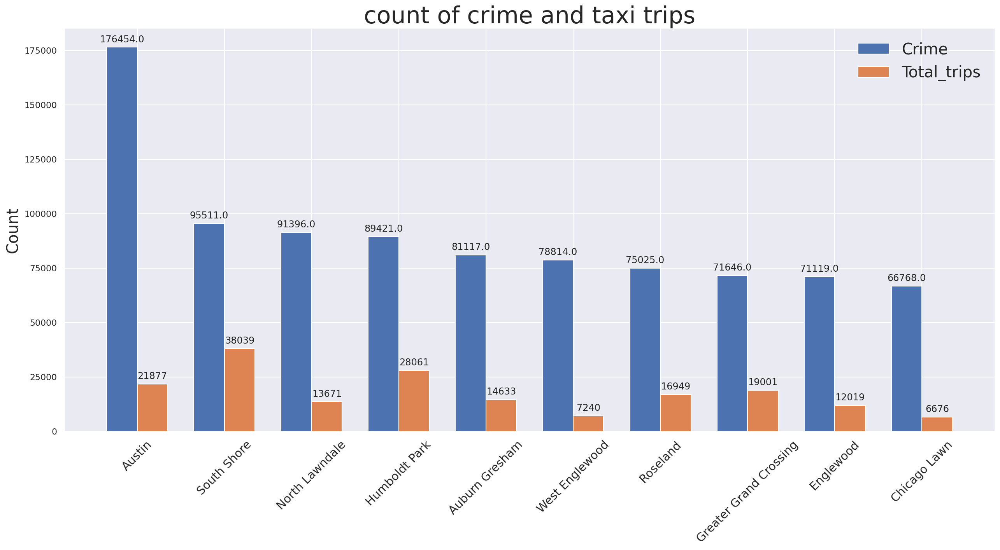

In [653]:
# Query to fetch the taxi demand in the top 10 areas where the crime rate is the highest. 
crime_rate_vs_taxi_trips_query = """
                            WITH TABLE As(
                            SELECT * Except (Date,Community_Area_Number,community_area)
                            FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_cln` as taxi_trip_dataset
                            JOIN `us-gcp-ame-con-01e-npd-1.chcg_dtst.comm_area`  as community_area_dataset ON taxi_trip_dataset.pickup_community_area = community_area_dataset.Community_Area_Number
                            Join `us-gcp-ame-con-01e-npd-1.chcg_dtst.chicago_crime` as crime_data_set on taxi_trip_dataset.pickup_community_area = crime_data_set.community_area
                            # Join `us-gcp-ame-con-01e-npd-1.chcg_dtst.weather_daily_averages` as weather_data_set on taxi_trip_dataset.Date = weather_data_set.Date
                            )
                            SELECT name,count(trip_start_timestamp) as total_trips, avg(crime_count) as avg_crime_count
                            FROM table
                            where name != "Near North Side" and  name !="Loop" and name != "Near West Side" and name != "Lake View" and name != "West Town"
                            group by name
                            order by avg(crime_count) desc
                            Limit 10
                            
                            """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

crime_rate_vs_taxi_trips_query_job =client.query(crime_rate_vs_taxi_trips_query,job_config=safe_config)

# API request - run the query, and return a pandas DataFrame
crime_rate_vs_taxi_trips_query = crime_rate_vs_taxi_trips_query_job.to_dataframe()

# Label on the axis axis
labels = crime_rate_vs_taxi_trips_query.name

# Fetching the crime count values
crime_average = crime_rate_vs_taxi_trips_query.avg_crime_count

# Fetching the taxi trip values
taxi_trips_count = crime_rate_vs_taxi_trips_query.total_trips

# the label locations
x = np.arange(len(labels))  # the label locations

# the width of the bars
width = 0.35  

# Setting the size of the plots
fig, ax = plt.subplots(figsize=(18,10))

# Setting the params of crime bar 
rects1 = ax.bar(x - width/2, crime_average, width, label='Crime')

# Setting the params of tatal trips bar 
rects2 = ax.bar(x + width/2, taxi_trips_count, width, label='Total_trips')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count', fontsize = 20)

# Adding the title
ax.set_title('count of crime and taxi trips', fontsize= 30)

# Seeing the tick labels for axis
ax.set_xticks(x)

# Setting the size and rotation for the x axis tick labels.
ax.set_xticklabels(labels, fontsize = 15, rotation = 45)

# Setting the legend
ax.legend(prop={'size': 20})

# Attach a text label above each bar in *rects*, displaying its height.
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 4),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)

autolabel(rects2)

# Adjusting the plot
fig.tight_layout()

# Saving the plot
plt.savefig('Crime Rate vs Taxi Trips.png')

# Displaying the plot
plt.show()

In [425]:
# Uploading the crime data csv dataset
import pandas as pd

crime_data = pd.read_csv('crime_count.csv')

# Converting the crime count into log values

crime_data['crime_count'] = np.log(crime_data['crime_count'])

In [14]:
crime_data['community_area'] = crime_data['community_area'].astype('str')

In [15]:
# Crime count by community number on the Chicago City Map. 
# Darker colour indicates higher crime rate

#Define coordinates of where we want to center our map
chicago_coords = [41.881832, -87.623177]
m = folium.Map(location=chicago_coords, tiles="cartodbpositron", zoom_start=10)


bins = list(crime_data["crime_count"].quantile([0,0.25,0.75,0.95,1]))

with open('Boundaries - Community Areas (current).geojson') as jsonfile:
    data = json.load(jsonfile)

folium.Choropleth(
    geo_data=data,
    data=crime_data,
    columns=["community_area", "crime_count"],
    fill_color="YlOrRd",
    key_on = 'feature.properties.area_num_1',
    fill_opacity=0.6,
    line_opacity=0.5,
    legend_name="Community Area",
    bins=bins,
    reset=True,
    popup="community_area"
).add_to(m)

folium.LayerControl().add_to(m)

m

In [17]:
crime_data_rate.head(5)

,crime_rating,community_area
0,1.000000,25
1,0.607029,8
2,0.540836,43
3,0.518027,29
4,0.506847,23


In [426]:
# Crime Rating by community number on the Chicago City Map. 
# Darker colour indicates higher crime rating
# Each community crime rating is calculated by dividing the crime count for each community/ highest crime count among all communities

import branca
import json
import requests


#Define coordinates of where we want to center our map
chicago_coords = [41.881832, -87.623177]

m = folium.Map(location=chicago_coords, tiles="cartodbpositron", zoom_start=10)


bins = list(crime_data_rate["crime_rating"].quantile([0,0.25,0.75,0.95,1]))

with open('Boundaries - Community Areas (current).geojson') as jsonfile:
    data = json.load(jsonfile)

folium.Choropleth(
    geo_data=data,
    data=crime_data_rate,
    columns=["community_area", "crime_rating"],
    fill_color="YlOrRd",
    key_on = 'feature.properties.area_num_1',
    fill_opacity=0.6,
    line_opacity=0.5,
    legend_name="Community Area",
    bins=bins,
    reset=True,
).add_to(m)

folium.LayerControl().add_to(m)

m.save('density_crime.html')

m

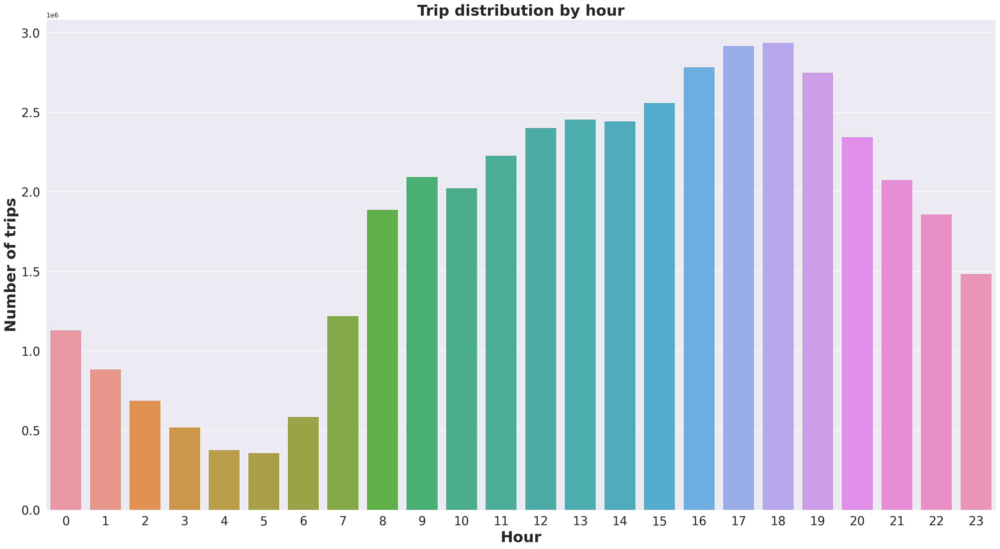

In [671]:
rides_per_month_query = """SELECT EXTRACT(HOUR FROM trip_start_timestamp) AS hour, 
                               COUNT(1) AS num_trips
                        FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                        GROUP BY hour
                        ORDER BY hour""" 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)
rides_per_month_query_job =client.query(rides_per_month_query,job_config=safe_config)
# API request - run the query, and return a pandas DataFrame
rides_per_month_result = rides_per_month_query_job.to_dataframe()
# View results


rides_per_month_result
sns.barplot(x='hour', y='num_trips', data = rides_per_month_result)

# Setting title, xlabel and ylabel
plt.title('Trip distribution by hour', fontsize = 25, weight = 'bold')
plt.xlabel('Hour', fontsize = 25, weight = 'bold')
plt.xticks(fontsize = 20)
plt.ylabel('Number of trips', fontsize = 25, weight = 'bold')
plt.yticks(fontsize = 20)

plt.show()

## Bivariate Analysis

In [677]:
# importing packages 
import pandas as pd 
import matplotlib.pyplot as plt 

# Calculating inital distribution of our target variable Side
query = """SELECT Side,count(Side) as cnt, (count(Side)/(select count(*) from `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_fnl`))*100 as side_percent
                        FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                        group by Side
                        order by side_percent desc
                        """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

query_job =client.query(query,job_config=safe_config)

# API request - run the query, and return a pandas DataFrame
query_job_result = query_job.to_dataframe()

# View results  
query_job_result

,Side,cnt,side_percent
0,Central,26826006,62.305997
1,Far North Side,5578358,12.956277
2,West Side,5421700,12.592423
3,North Side,3466971,8.052376
4,Southwest Side,1112717,2.584393
5,South Side,407954,0.947513
6,Northwest Side,169459,0.393585
7,Far Southeast Side,49726,0.115493
8,Far Southwest Side,22364,0.051943


In [678]:
# importing packages 
import pandas as pd 
import matplotlib.pyplot as plt 

# Calculating inital distribution of our target variable Side
query = """SELECT Side,count(Side) as cnt, (count(Side)/(select count(*) from `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_fnl`))*100 as side_percent
                        FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                        group by Side
                        order by side_percent desc
                        """ 

# Set up the query
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)

query_job =client.query(query,job_config=safe_config)

# API request - run the query, and return a pandas DataFrame
query_job_result = query_job.to_dataframe()

# View results  
query_job_result

,Side,cnt,side_percent
0,Central,26826006,62.305997
1,Far North Side,5578358,12.956277
2,West Side,5421700,12.592423
3,North Side,3466971,8.052376
4,Southwest Side,1112717,2.584393
5,South Side,407954,0.947513
6,Northwest Side,169459,0.393585
7,Far Southeast Side,49726,0.115493
8,Far Southwest Side,22364,0.051943


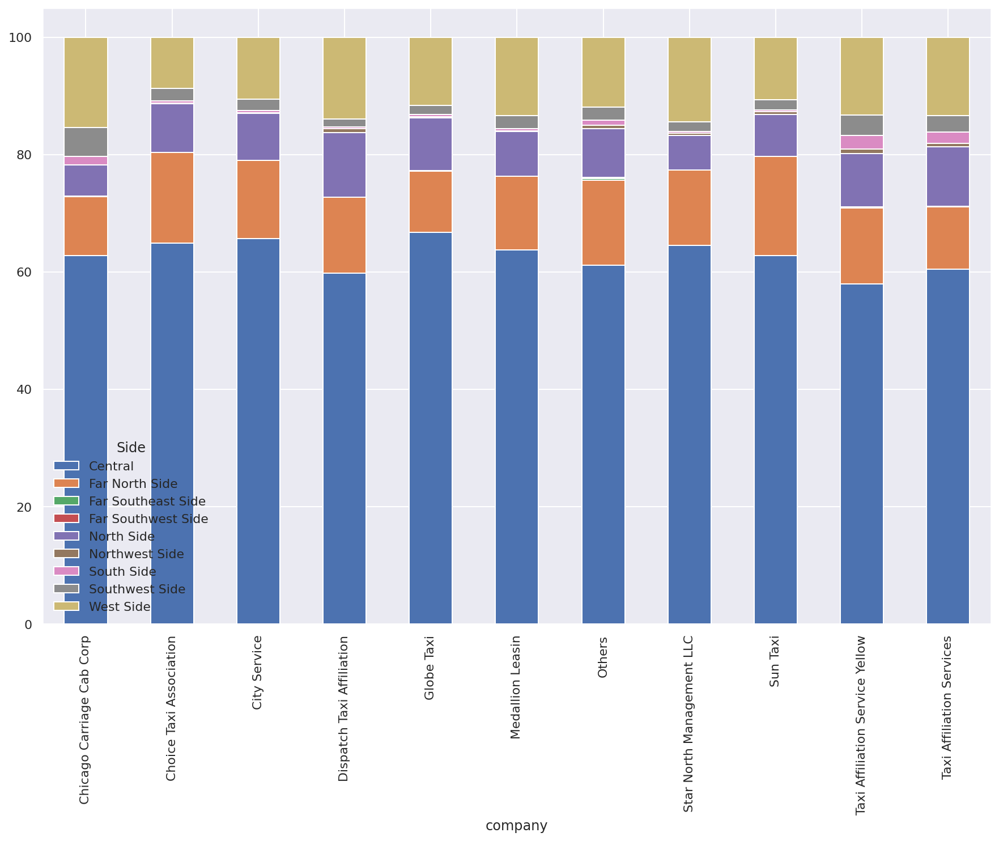

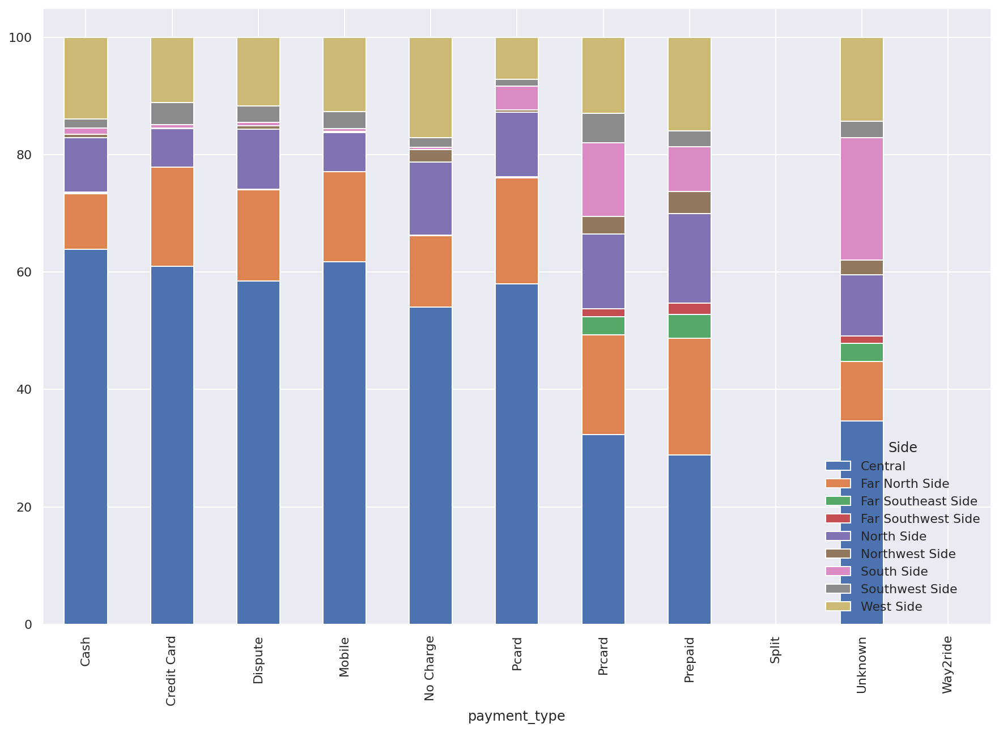

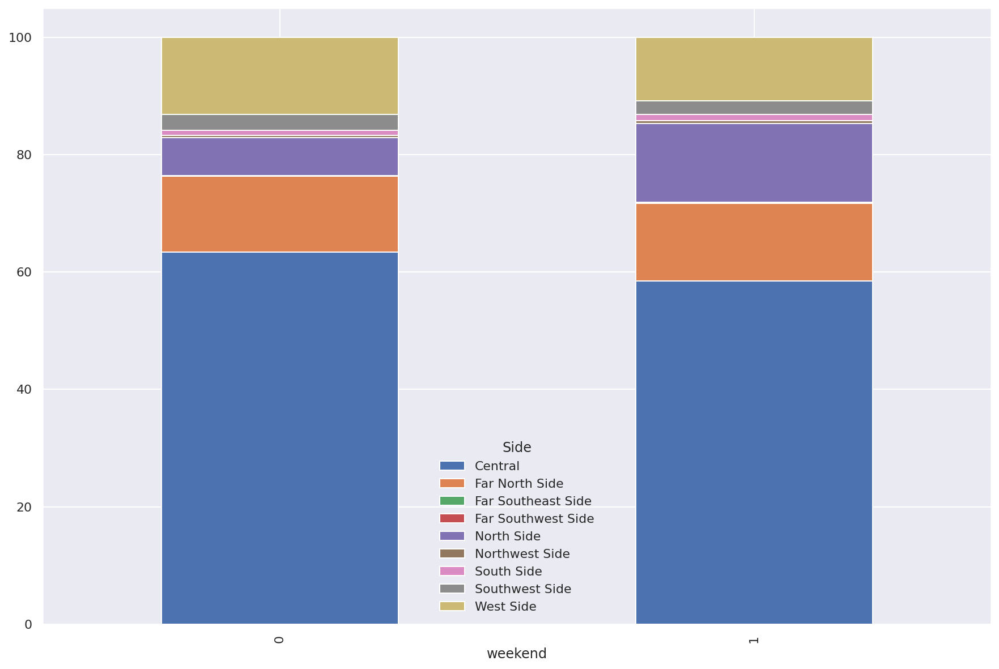

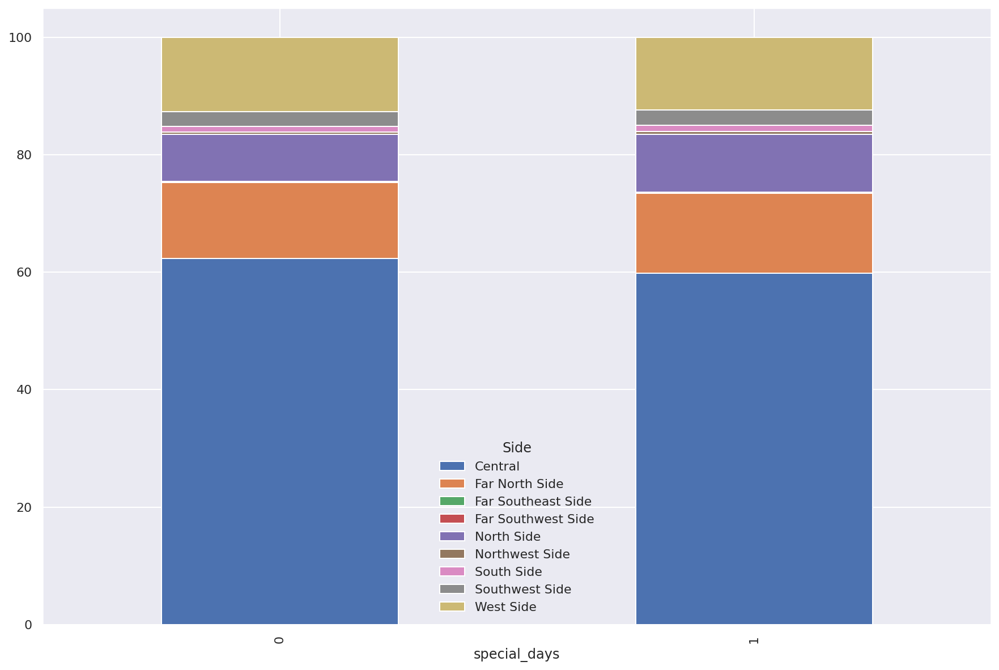

In [680]:


column_names = client.list_rows(table, max_results=5).to_dataframe().columns.tolist()

column_names
cat_cols = ['company',
 'payment_type',
 'weekend',
 'special_days']

for col in cat_cols:
    query = """SELECT {},count({}) cnt
                        FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                        group by {}
                        order by cnt desc
                        limit 10
                        """.format(col,col,col)

    # Set up the query
    safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)
    
    query_job =client.query(query,job_config=safe_config)
    
    # API request - run the query, and return a pandas DataFrame
    query_job_result = query_job.to_dataframe()
    
    col_buckets = list(query_job_result[col])
    
    query = """SELECT Side, {},count({}) as cnt
                        FROM `us-gcp-ame-con-01e-npd-1.chcg_dtst.tx_trps_eda`
                        group by {},side
                        order by cnt desc
                        """.format(col,col,col)

    # Set up the query
    safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=10**10)
    query_job =client.query(query,job_config=safe_config)
    # API request - run the query, and return a pandas DataFrame
    query_job_result = query_job.to_dataframe()

    
#     if len(col_buckets)==10 :
    if col == 'company':
        for ind in query_job_result.index:
            if query_job_result[col][ind] not in col_buckets:
                query_job_result[col][ind] = 'Others'

    query_job_result1 = query_job_result.groupby(['Side',col]).sum().reset_index()
    
    query_job_result_p = query_job_result1.pivot(col,"Side","cnt")
    
    # Set the figure size - handy for larger output
    from matplotlib import pyplot as plt
    
    plt.rcParams["figure.figsize"] = [15, 10]
    
    # Set up with a higher resolution screen 
    %config InlineBackend.figure_format = 'retina'

    stacked_data = query_job_result_p.apply(lambda x: x*100/sum(x), axis=1)
    
    stacked_data.plot(kind="bar", stacked=True)
    
    
    # Saving the Figures
    if col == "weekend":
        plt.savefig("weekend_taxi_trips.png")
    if col == "special_days":
         plt.savefig("specialdays_taxi_trips.png")